# Задание 1. Архитектура U-Net

В этом задании вам необходимо создать U-Net-подобную сеть для сегментации документов.

В качестве датасета для обучения нейросети будет использоваться фрагмент [midv500 🎓[arxiv]](https://arxiv.org/abs/1807.05786). Это датасет, содержащий фотографии документов, таких как паспорт или водительское удостоверение.

## Формат результата

Корректно прописанная U-Net-подобная сеть со skip connections. Параметры слоев согласованы. Вывод `torchsummary` без ошибок:

```
  ----------------------------------------------------------------
          Layer (type)               Output Shape         Param #
  ================================================================

  ....

  ================================================================
  Total params:
  
  ...

```


## Загрузка данныx







Импорт необходимых библиотек:

In [1]:
!pip install -q lightning==2.5.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.3/815.3 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 62.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import os
import glob
import torch
import numpy as np
import matplotlib.pyplot as plt

from torch import nn
from PIL import Image
from torchsummary import summary
from torchvision import tv_tensors
from torchvision.io import read_image
from torchvision.transforms import v2
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader

In [ ]:
! wget -qN https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/midv500p.zip
! unzip -q midv500p.zip
! rm midv500p.zip

Класс `MaskDataset` возвращает часть датасета для обучения при `train_part=True` и тестовую часть при `train_part=False`.

Каждый экземпляр датасета состоит из двух изображений: входного изображения и размеченной маски.

In [4]:
from PIL import Image, ImageFile

# To bypass error on corrupted files:
# https://stackoverflow.com/questions/12984426/pil-ioerror-image-file-truncated-with-big-images
# ImageFile.LOAD_TRUNCATED_IMAGES = False


class MaskDataset(Dataset):
    def __init__(
        self,
        train_part=True,
        transforms=None,  # for image and mask
        transform=None,  # for image only
        target_transform=None,  # for mask only
        path="midv500p",
    ):
        self.transform = transform
        self.transforms = transforms
        self.target_transform = target_transform
        path += "/train" if train_part else "/val"
        files = glob.glob(path + "/image/*")
        self.loaded_images = []
        self.loaded_masks = []

        for filename in files:  # cache all data in memory
            self.loaded_images.append(read_image(filename) / 255)
            mask_fn = filename.replace("image", "mask").replace("jpg", "png")
            self.loaded_masks.append(read_image(mask_fn) / 255)

    def __getitem__(self, i):
        img = self.loaded_images[i]
        mask = self.loaded_masks[i]
        if self.transforms is not None:
            img, mask = self.transforms(
                tv_tensors.Image(img),
                tv_tensors.Mask(mask),
            )
        if self.transform is not None:
            img = self.transform(img)

        if self.target_transform is not None:
            mask = self.target_transform(mask)
        return img, mask

    def __len__(self):
        return len(self.loaded_images)

Подумайте, какие аугментации и нормализации приемлемы, и примените их. Обратите внимание, что по коду выше `transforms` применяется и к маске, и к изображению, `transform` — только к изображению, а `target_transform` — только к маске.

Допускается использовать библиотеку [albumentations 🐾[git]](https://github.com/albumentations-team/albumentations).

In [5]:
from torchvision.transforms import v2


v2_transforms = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
        v2.RandomRotation(degrees=(-45, 45)),
        v2.RandomHorizontalFlip(p=0.3),
        v2.RandomVerticalFlip(p=0.3),
        v2.RandomPerspective(
          distortion_scale=0.1,
          p=0.3,
          interpolation=v2.InterpolationMode.BILINEAR
          ),
        v2.Resize((224, 224), antialias=True),  # antialias to suppress warning
    ]
)

trainset = MaskDataset(train_part=True, transforms=v2_transforms)
valset = MaskDataset(train_part=False, transforms=v2_transforms)

train_loader = DataLoader(trainset, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(valset, batch_size=4, shuffle=False, num_workers=2)

Убедитесь, что код работает. Для этого воспользуйтесь приведенным ниже тестом.

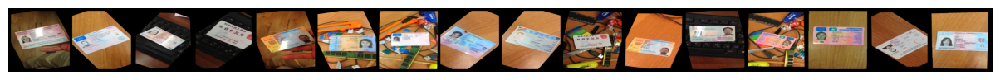

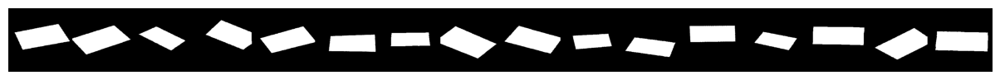

In [6]:
def show(batch, cols=16):
    cols = min(cols, len(batch))
    img_grid = make_grid(batch[:cols], padding=10, nrow=cols)
    plt.figure(figsize=(cols, 1))
    plt.axis("off")
    plt.imshow(np.transpose((img_grid * 255).numpy().astype(np.uint8), (1, 2, 0)))


images, masks = next(iter(train_loader))

show(images)
show(masks)

## Модель

Опишите структуру  модели. Необходимо реализовать [UNet-подобную 🎓[arxiv]](https://arxiv.org/pdf/1505.04597.pdf) архитектуру. На выходе модели — logit-ы.

Совет: в этом задании не будет строгих требований на точность. Используйте небольшое количество каналов и ограничьтесь двумя-тремя сжимающими и таким же количеством разжимающих слоев.


In [7]:
def encoder_block(in_channels, out_channels, kernel_size, padding):
    x = nn.Sequential(
          nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding),
          nn.BatchNorm2d(num_features = out_channels),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )

    return x

def decoder_block(in_channels, out_channels, kernel_size, padding):
    x = nn.Sequential(
         nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding),
         nn.BatchNorm2d(num_features = out_channels),
         nn.ReLU(),
         nn.Upsample(scale_factor=2, mode='bilinear'),
    )
    return x


class MiniUnet(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc1_block = encoder_block(3, 32, 7, 3)
        self.enc2_block = encoder_block(32, 64, 3, 1)
        self.enc3_block = encoder_block(64, 128, 3, 1)
        self.dec1_block = decoder_block(128, 64, 3, 1)
        self.dec2_block = decoder_block(128, 32, 3, 1)
        self.dec3_block = decoder_block(64, 1, 3, 1)

    def forward(self, x):
        enc1 = self.enc1_block(x)
        enc2 = self.enc2_block(enc1)
        enc3 = self.enc3_block(enc2)

        dec1 = self.dec1_block(enc3)
        dec2 = self.dec2_block(torch.cat([dec1, enc2], 1))
        dec3 = self.dec3_block(torch.cat([dec2, enc1], 1))

        return dec3

Проверим модель:

In [8]:
from torchsummary import summary

model = MiniUnet()
summary(model, (3, 224, 224), device="cpu")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]           4,736
       BatchNorm2d-2         [-1, 32, 224, 224]              64
              ReLU-3         [-1, 32, 224, 224]               0
         MaxPool2d-4         [-1, 32, 112, 112]               0
            Conv2d-5         [-1, 64, 112, 112]          18,496
       BatchNorm2d-6         [-1, 64, 112, 112]             128
              ReLU-7         [-1, 64, 112, 112]               0
         MaxPool2d-8           [-1, 64, 56, 56]               0
            Conv2d-9          [-1, 128, 56, 56]          73,856
      BatchNorm2d-10          [-1, 128, 56, 56]             256
             ReLU-11          [-1, 128, 56, 56]               0
        MaxPool2d-12          [-1, 128, 28, 28]               0
           Conv2d-13           [-1, 64, 28, 28]          73,792
      BatchNorm2d-14           [-1, 64,

# Задание 2. Обучение модели

Обучите модель из предыдущего задания, используя Lightning:

- В качестве loss можно использовать BCE (`BCELoss` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html), `BCEWithLogitsLoss` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.BCEWithLogitsLoss.html)), IoU, Dice или их комбинацию.
- Убедитесь, что модель обучается.
- Вычислите метрику качества на валидационной выборке (например, [IoU 📚[wiki]](https://en.wikipedia.org/wiki/Jaccard_index)).

## Формат результата

1.  График целевой метрики для вашей модели. Предпочтительно в формате TB или WandB.
2.  Сегментированные изображения документов.

Пример изображения:

<img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.4/Exercises/EX11/result_2_task_ex11.png">

## Метрика IoU

Для вычисления IoU метрики будем использовать библиотеку SMP.

Установка и импорт необходимых библиотек:

In [9]:
!pip install -q lightning==2.5.0 segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.5 MB/s eta 0:00:00


In [ ]:
import torch
import torchvision
import lightning as L
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger
from segmentation_models_pytorch.losses import JaccardLoss
from segmentation_models_pytorch.metrics import get_stats, iou_score
from segmentation_models_pytorch.losses.constants import BINARY_MODE,MULTILABEL_MODE

Мы привыкли работать с TorchMetrics. Для удобной работы с метриками из библиотеки SMP напишем класс-адаптер.
Важно: обратите внимание, что `update` принимает в качестве `pred` logit-ы.

In [11]:
class SMPMetricAdapter:
    values = None

    def __init__(self, metric):
        self.reset()
        self.metric = metric

    def compute(self):
        return torch.Tensor(self.values).mean()

    def update(self, pred, gt):
        pred = pred.cpu().sigmoid()
        gt = gt.cpu().long()
        tp, fp, fn, tn = get_stats(pred, gt, mode="binary", threshold=0.5)
        metric_val = self.metric(tp, fp, fn, tn, reduction="micro")
        self.values.append(metric_val)

    def reset(self):
        self.values = []

Теперь свою метрику можно создать так:

In [12]:
from segmentation_models_pytorch.metrics import iou_score

iou_from_smp = SMPMetricAdapter(iou_score)

## Обучение

В этом блоке разместите код пайплайна обучения на Lightning:

In [27]:
import lightning as L


class Pipeline(L.LightningModule):
    def __init__(self, model, lr=0.001):
        super().__init__()
        self.model = model
        self.criterion = nn.BCEWithLogitsLoss()
        self.train_metric = SMPMetricAdapter(iou_score)
        self.val_metric = SMPMetricAdapter(iou_score)
        self.test_metric = SMPMetricAdapter(iou_score)
        self.lr = lr
    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.model.parameters(), lr=self.lr,weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
        )
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "interval": "epoch",
                "monitor": "loss"
            },
        }
    def training_step(self, batch, batch_idx):
        x,y = batch
        out = self.model(x)
        loss = self.criterion(out, y)
        self.train_metric.update(out, y)
        self.log("loss", loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        self.val_metric.update(out, y)

    def on_train_epoch_end(self):
        self.log_dict({"IoU/train":self.train_metric.compute()})
        self.train_metric.reset()

        self.log_dict({"IoU/val":self.val_metric.compute()})
        self.val_metric.reset()

    def test_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        self.test_metric.update(out, y)

    def on_test_epoch_end(self):
        self.log_dict({"IoU/test":self.test_metric.compute()})
        self.test_metric.reset()


Если для визуализации результатов обучения вы используете TensorBoard, инициализируйте его в ячейке ниже:

In [33]:
%load_ext tensorboard
%tensorboard --logdir "ex2"

Output hidden; open in https://colab.research.google.com to view.

Настройте `Trainer` и обучите модель. Воспользуйтесь `ModelCheckpoint` для сохранения состояния модели, соответствующего лучшему IoU на валидационных данных:

In [18]:
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger

mini_unet = MiniUnet()
checkpoint_callback = ModelCheckpoint(
        monitor="IoU/val", mode="max", filename="model"
)
pl_model = Pipeline(mini_unet,lr=0.01)
trainer = L.Trainer(
        max_epochs=30,
        callbacks=[checkpoint_callback],
        num_sanity_val_steps=0,
        log_every_n_steps=10,
        logger=L.pytorch.loggers.TensorBoardLogger(save_dir="ex2"),
        enable_progress_bar=True,
    )
trainer.fit(model = pl_model,train_dataloaders=train_loader,val_dataloaders=val_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name      | Type              | Params | Mode 
--------------------------------------------------------
0 | model     | MiniUnet          | 208 K  | train
1 | criterion | BCEWithLogitsLoss | 0      | train
--------------------------------------------------------
208 K     Trainable params
0         Non-trainable params
208 K     Total params
0.836     Total estimated model params size (MB)
32        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=30` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


## Валидация

Загрузите веса модели с лучшим IoU из контрольной точки.

Совет: в случае возникновения проблем с загрузкой модели вам поможет [блокнот про Lightning 🥨[colab]](https://colab.research.google.com/drive/16Q_k7NR4oGMh5CrqErsdzWwpihlK4lbH), раздел CheckPoint.

In [20]:
ckpt_path = "ex2/lightning_logs/version_1/checkpoints/model.ckpt"
checkpoint = torch.load(ckpt_path, weights_only=True, map_location="cpu")
state_dict = {}
for key in checkpoint["state_dict"].keys():
    key_new = key[len('model.'):]
    state_dict[key_new] = checkpoint["state_dict"][key]

model = MiniUnet()
model.load_state_dict(state_dict)

<All keys matched successfully>

Оцените результат визуально:

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def show_valset_pred(model, cols=16):
    model.to(device)
    images, pred_masks = [], []
    try:
        tmp = valset.transform
        valset.transform = None
        for batch in valset:
            with torch.no_grad():
                img, mask = batch
                images.append(img.unsqueeze(0))
                output = model(img.unsqueeze(0).to(device))
                pred_masks.append(output.cpu())

    finally:
        valset.transform = tmp
    show(torch.stack(images).squeeze()[:cols, ...])
    binary_mask = torch.stack(pred_masks) > 0.5
    show(binary_mask.squeeze(1).float()[:cols, ...])

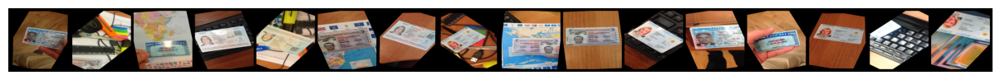

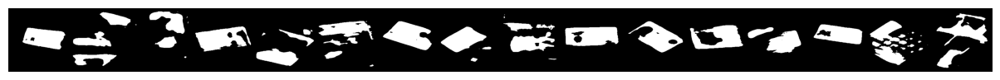

In [22]:
show_valset_pred(model, 16)

In [28]:
pl_model = Pipeline(model=model)
trainer.test(model = pl_model,dataloaders=val_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         IoU/test          │    0.24404630064964294    │
└───────────────────────────┴───────────────────────────┘

[{'IoU/test': 0.24404630064964294}]

# Задание 3. Сравнение моделей

- Импортируйте UNet из [SMP 🐾[git]](https://github.com/qubvel/segmentation_models.pytorch#models), в качестве backbone используйте EfficientNet-b0 (не предобученный).
- Обучите ее на том же датасете и с теми же гиперпараметрами, которые вы использовали во 2-м задании.
- Сравните целевую метрику для обеих моделей.
- Визуализируйте результаты сегментации.

## Формат результата

1.  Графики целевой метрики для разных моделей. Предпочтительно в формате TB или WandB.
2.  Сегментированные изображения документов.

Пример изображения:

<img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.4/Exercises/EX11/result_3_task_ex11.png">

## Обучение

Загрузите непредобученную модель:

In [29]:
import segmentation_models_pytorch as smp
from IPython.display import clear_output


smp_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)


clear_output()

При необходимости добавьте дополнительную предобработку данных.

Обучите модель:

In [34]:
checkpoint_callback = ModelCheckpoint(
        monitor="IoU/val", mode="max", filename="model"
)
pl_model = Pipeline(smp_unet,lr=0.01)
trainer = L.Trainer(
        max_epochs=20,
        callbacks=[checkpoint_callback],
        num_sanity_val_steps=0,
        log_every_n_steps=10,
        logger=L.pytorch.loggers.TensorBoardLogger(save_dir="ex2"),
        enable_progress_bar=True,
    )
trainer.fit(model = pl_model,train_dataloaders=train_loader,val_dataloaders=val_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name      | Type              | Params | Mode 
--------------------------------------------------------
0 | model     | Unet              | 24.4 M | eval 
1 | criterion | BCEWithLogitsLoss | 0      | train
--------------------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.745    Total estimated model params size (MB)
1         Modules in train mode
188       Modules in eval mode
INFO:lightning.pytorch.

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


## Валидация

Загрузите веса модели с лучшим IoU из контрольной точки:

In [39]:
ckpt_path = "ex2/lightning_logs/version_5/checkpoints/model.ckpt"
checkpoint = torch.load(ckpt_path, weights_only=True, map_location="cpu")
state_dict = {}
for key in checkpoint["state_dict"].keys():
    key_new = key[len('model.'):]
    state_dict[key_new] = checkpoint["state_dict"][key]

smp_unet_model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)
smp_unet_model.load_state_dict(state_dict)

<All keys matched successfully>

Визуализируем результат для модели из 1-го задания:

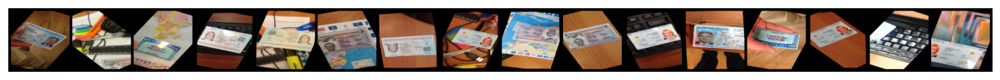

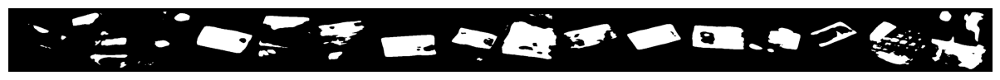

In [36]:
show_valset_pred(model, 16)

И для модели из SMP:

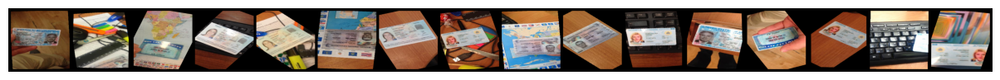

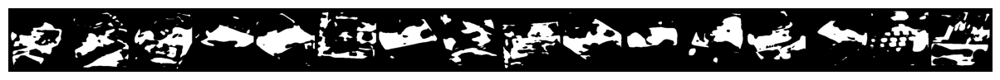

In [40]:
show_valset_pred(smp_unet_model, 16)

In [41]:
pl_model = Pipeline(model=smp_unet_model)
trainer.test(model = pl_model,dataloaders=val_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         IoU/test          │    0.4610852003097534     │
└───────────────────────────┴───────────────────────────┘

[{'IoU/test': 0.4610852003097534}]

# Задание 4. Применение YOLOv11

1.  Используйте [ultralytics 🛠️[doc]](https://docs.ultralytics.com/models/) и модель `yolo11n`.
2. Убедитесь, что модель отрабатывает на произвольной картинке.
3. Используя [pycocotools 🐾[git]](https://github.com/cocodataset/cocoapi.git), загрузите 5 первых изображений с велосипедами.
4. Проведите детектирование велосипедов при помощи YOLO.
5. Выведите картинки с наложенными на них Bounding Boxes: детектированные YOLO — красным цветом, разметку из COCO — зеленым.

Дополнительно*: Оцените точность детектирования по метрике [AP 🛠️[doc]](https://cocodataset.org/#detection-eval), используя  `cocoEval.evaluate` [🐾[git]](https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/cocoeval.py).

## Формат результата
Картинки с наложенными на них Bounding Boxes: детектированные YOLO — красным цветом, разметку из COCO — зеленым.

Пример изображения:


<img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.4/Exercises/EX11/result_4_task_ex11.png" width="400">






##  Загрузите YOLO


Установка и импорт необходимых библиотек:

In [1]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 30.5 MB/s eta 0:00:00


In [2]:
import io
import json
import zipfile
import requests
import ultralytics
import numpy as np
import matplotlib.pyplot as plt

from io import BytesIO
from PIL import Image, ImageDraw
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Создайте экземпляр предобученной модели `yolo11n`

In [3]:
ultralytics.checks()

Ultralytics 8.3.142 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.3/112.6 GB disk)


In [4]:
yolo = YOLO("yolo11n.pt")

100%|██████████| 5.35M/5.35M [00:00<00:00, 368MB/s]


## Smoke test

Убедитесь, что модель отрабатывает на произвольной картинке.

In [5]:
!wget -qO cat.png https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.4/Exercises/EX11/semantic_segmentation.png

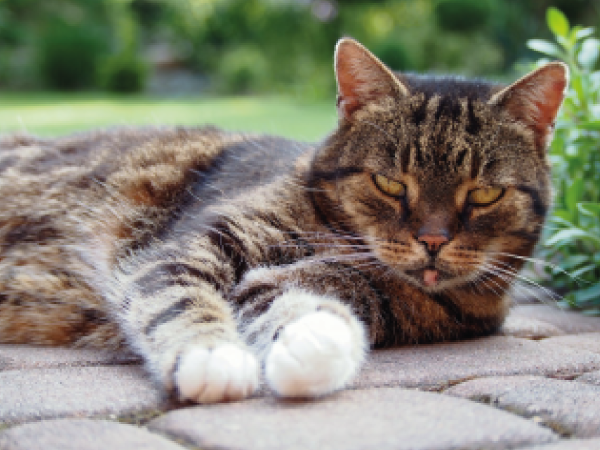

In [6]:
img = Image.open("/content/cat.png")
display(img)


0: 480x640 1 cat, 45.4ms
Speed: 27.0ms preprocess, 45.4ms inference, 315.5ms postprocess per image at shape (1, 3, 480, 640)


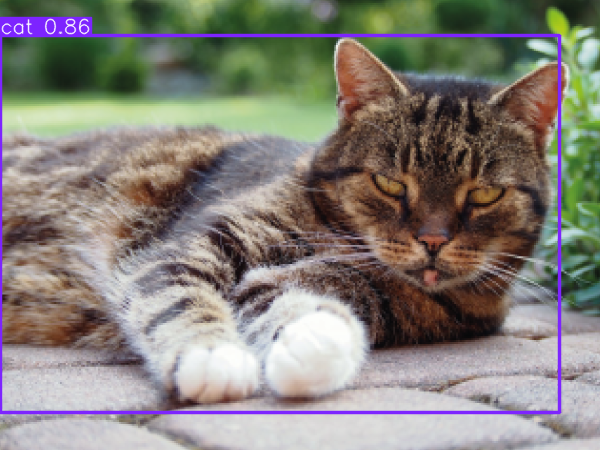

In [7]:
result = yolo(img)
result[0].show()

## Загрузка данных

Загрузите 5 первых изображений с велосипедами из COCO.

*  Используйте [pycocotools 🐾[git]](https://github.com/cocodataset/cocoapi.git).
*  Выведите загруженные изображения.

In [8]:
!wget -qN "https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/annotations_trainval2017.zip"
!unzip -qn annotations_trainval2017.zip

In [9]:
coco_train = COCO("annotations/instances_train2017.json")
coco_val = COCO("annotations/instances_val2017.json")

loading annotations into memory...
Done (t=18.56s)
creating index...
index created!
loading annotations into memory...
Done (t=0.82s)
creating index...
index created!


## Детектирование


Детектируйте на загруженных картинках велосипеды при помощи YOLO.

Затем выведите предсказанные YOLO bboxes красным цветом, а разметку из COCO — зеленым цветом.

[[doc] 🛠️](https://pytorch.org/vision/stable/utils.html) `torchvision.utils`

In [10]:
bike_cat_id = coco_train.getCatIds(catNms=["bicycle"])[0]
image_ids = coco_train.getImgIds(catIds=[bike_cat_id])
ann_ids = coco_train.getAnnIds(imgIds=image_ids, catIds=[bike_cat_id])
anns = coco_train.loadAnns(ann_ids)

In [11]:
import os
os.makedirs("bike_images", exist_ok=True)
for img_id in image_ids[:5]:
    img_info = coco_train.loadImgs(img_id)[0]
    url = img_info["coco_url"]
    file_name = img_info["file_name"]
    out_path = os.path.join("bike_images", file_name)

    if not os.path.exists(out_path):
        print(f"Downloading {file_name}...")
        img_data = requests.get(url).content
        with open(out_path, "wb") as f:
            f.write(img_data)

In [12]:
for img_id in image_ids[:5]:
    img_info = coco_train.loadImgs(img_id)[0]
    file_name = img_info["file_name"]
    img = Image.open(os.path.join("bike_images", file_name))
    result = yolo(img)
    yolo_boxes = result[0].boxes.xyxy.cpu().numpy()
    yolo_classes = result[0].boxes.cls.cpu().numpy()
    draw = ImageDraw.Draw(img)
    for box,cls in zip(yolo_boxes,yolo_classes):
        if cls == 1:
           draw.rectangle(box, outline="red",width = 3)
    cur_anns = [ann for ann in anns if ann['image_id'] == img_id]
    for ann in cur_anns:
        x, y, w, h = ann['bbox']
        draw.rectangle([x, y, x + w, y + h], outline="green",width = 3)
    display(img)

Output hidden; open in https://colab.research.google.com to view.

## Дополнительно*: Оценка качества

Оцените точность детектирования для категории велосипед по метрике AP, используя `cocoEval.evaluate` [🐾[git]](https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/cocoeval.py), или библиотеку [SMP 🐾[git]](https://github.com/qubvel/segmentation_models.pytorch), или [TorchMetrics 🐾[git]](https://github.com/Lightning-AI/torchmetrics).

### Формат результата


Значения AP (пример):

```python
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.098
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.259
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.102
 ...
```


In [15]:
predictions = []
for img_id in image_ids[:5]:
    img_info = coco_train.loadImgs(img_id)[0]
    file_name = img_info["file_name"]
    img_path = os.path.join("bike_images", file_name)
    img = Image.open(img_path)

    results = yolo(img)
    boxes = results[0].boxes.xyxy.cpu().numpy()
    scores = results[0].boxes.conf.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy().astype(int)

    for box, score, cls in zip(boxes, scores, classes):
        if cls == 1:
            xmin, ymin, xmax, ymax = box
            width = xmax - xmin
            height = ymax - ymin
            predictions.append({
                "image_id": img_id,
                "category_id": 2,
                "bbox": [float(xmin), float(ymin), float(width), float(height)],
                "score": float(score),
            })


0: 640x480 5 bicycles, 2 cars, 16.1ms
Speed: 3.1ms preprocess, 16.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

0: 448x640 8 persons, 2 bicycles, 1 motorcycle, 15.3ms
Speed: 1.8ms preprocess, 15.3ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 9 persons, 6 bicycles, 1 truck, 16.8ms
Speed: 1.7ms preprocess, 16.8ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 13 persons, 11 skateboards, 15.7ms
Speed: 1.9ms preprocess, 15.7ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 10 persons, 7 bicycles, 1 car, 1 clock, 15.6ms
Speed: 3.5ms preprocess, 15.6ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


In [16]:
with open("bike_preds.json", "w") as f:
    json.dump(predictions, f)

In [25]:
coco_dt = coco_train.loadRes("bike_preds.json")
bike_cat_id = 2
filtered_images = coco_train.loadImgs(image_ids[:5])
filtered_ann_ids = coco_train.getAnnIds(imgIds=image_ids[:5])
filtered_anns = coco_train.loadAnns(filtered_ann_ids)
cat_ids = list(set([ann['category_id'] for ann in filtered_anns]))
filtered_cats = coco_train.loadCats(cat_ids)

filtered_dataset = {
    'images': filtered_images,
    'annotations': filtered_anns,
    'categories': filtered_cats
}


coco_filtered = COCO()
coco_filtered.dataset = filtered_dataset
coco_filtered.createIndex()

coco_eval = COCOeval(coco_filtered, coco_dt, iouType='bbox')
coco_eval.params.catIds = [bike_cat_id]
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.297
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.437
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.325
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.030
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.468
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.601
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.081
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.342
 Average Recall     (AR) @[ IoU=0.5

Средняя точность составляет 0.297. Самая высокая точность достигается для больших объектов - 0.601. Модель хорошо локализуетс большие велосипеды, но плохо справляется с маленькими.